In [2]:
import os
import pickle
import numpy as np
from pathlib import Path
from collections import defaultdict

In [3]:
import logging
logging.basicConfig(level=logging.WARNING)

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import plot_confusion_matrix

In [6]:
os.chdir('PATH/code/zsl_text_imagenet/') # https://github.com/sebastianbujwid/zsl_text_imagenet

In [7]:
from omegaconf import OmegaConf

In [8]:
from definitions import ROOT_DIR
from data import imagenet
from match_wiki_articles import get_imagenet_structures

In [9]:
overwrite_config = {
}


configs = [
    ROOT_DIR / 'configs' / 'env_config.yml',
    # ROOT_DIR / 'configs' / 'matching_config.yml',
]

config = OmegaConf.merge(
    OmegaConf.load(str(configs[0])),
    # OmegaConf.load(str(configs[1])),
    OmegaConf.create(overwrite_config))
OmegaConf.set_readonly(config, True)
OmegaConf.set_struct(config, True)

args = {
}
args = OmegaConf.create(args)
OmegaConf.set_readonly(args, True)
OmegaConf.set_struct(args, True)

In [10]:
imagenet_ids, imagenet_id_details, imagenet_wordnet_ancestors, wordnet_to_wiki_categories = get_imagenet_structures(
    config.env,
    imagenet_split='mp500'
)

In [11]:
dataset_config = config.env.datasets.ImageNet
wnid_to_imagenet_id = imagenet.extract_wordnet_to_imagenet_id(dataset_config['imagenet_ids_to_wordnet'])

def class_details(wnid):
    imagenet_id = wnid_to_imagenet_id[wnid]
    wnid, phrases = imagenet_id_details[imagenet_id]
    if isinstance(phrases, str):
        phrases = [phrases]
    return (wnid, phrases)

In [12]:
all_wnids = [x[0] for x in imagenet_id_details.values()]
print(len(all_wnids))

21842


In [13]:
wordnet_to_wiki_categories

{'n00015388': ['Category:Animals', 'Category:Insects'],
 'n00017222': 'Category:Plants',
 'n00021939': ['Category:Goods (economics)',
  'Category:Artificial objects',
  'Category:Manufactured goods'],
 'n13134947': ['Category:Fruit', 'Category:Plants'],
 'n07707451': ['Category:Vegetables', 'Category:Crops', 'Category:Plants']}

In [14]:
imagenet_group_names = {
    'n00015388': 'Animal',
    'n00017222': 'Plant',
    'n07707451': 'Plant',
    'n13134947': 'Plant',
    'n00021939': 'Artifact',
}

### WordNet similarity

In [15]:
import networkx as nx

In [16]:
def parse_wordnet_hierarchy(file):
    with open(file, 'r') as f:
        parent_child_lines = f.read().splitlines()
    parent_child_pairs = [x.split(' ') for x in parent_child_lines]
    return parent_child_pairs

In [17]:
wordnet_hierarchy = parse_wordnet_hierarchy(Path('data') / 'imagenet' / 'wordnet.is_a.txt')

In [18]:
def graph_parents_to_children(parent_child_pairs):
    g = nx.DiGraph()
    all_nodes = set([x[0] for x in parent_child_pairs]).union([x[1] for x in parent_child_pairs])
    g.add_nodes_from(all_nodes)
    
    for parent, child in parent_child_pairs:
        g.add_edge(parent, child)
        
    return g


g = graph_parents_to_children(wordnet_hierarchy)
head_node = 'n00001740'

## Confusion matrices

In [19]:
def load_confusion_matrix(exp_path: Path):
    files = list(exp_path.rglob('confusion_matrix.pkl'))
    if len(files) == 0:
        raise ValueError(f'Cannot find confusion matrix file in {exp_path}')
    if len(files) > 1:
        raise ValueError(f'Found more than 1 confusion matrix file in {exp_path}')
    file = files[0]
    return pickle.load(open(file, 'rb'))

In [20]:
glove_cm = load_confusion_matrix(Path(
'PATH/cada_vae/zls/eval/mp500_seeds/wemb_glove_wiki_ALL/test_runrs-1019_42'
))
albert_xxl_cm = load_confusion_matrix(Path(
'PATH/cada_vae/zls/eval/mp500/albert-xxlarge-v2_wiki_ALL/runrs-xxl_ALL-1013'
))
w2v_classnames_cm = load_confusion_matrix(Path(
'PATH/cada_vae/zls/eval/mp500/w2v_wiki_ALL_better/run-0105_1lv3-arch-l1024-hi-sharedspaceenforce-b128_42'
))

In [21]:
def normalize_confusion_matrix(cm):
    normalized_cm = {wnid: defaultdict(int) for wnid in cm.keys()}
    for wnid, preds in cm.items():
        assert min(preds.values()) >= 0, "Negative values not allowed"
        s = sum(preds.values())
        normalized_cm[wnid] = defaultdict(int, {k: freq / s for k, freq in preds.items()})
        
    return normalized_cm

In [22]:
def confusion_matrix_difference(a, b, normalized=True):
    # assert a.keys() == b.keys()
    
    diff_cm = {wnid: defaultdict(int) for wnid in a.keys()}
    
    for true_wnid in a.keys():
        if normalized:
            count_sum = sum(a[true_wnid].values())
            
        for pred_wnid in set(a[true_wnid].keys()).union(b[true_wnid].keys()):
            count = a[true_wnid][pred_wnid] - b[true_wnid][pred_wnid]
            if count == 0:
                continue
            
            if normalized:
                diff_cm[true_wnid][pred_wnid] = count / count_sum
            else:
                diff_cm[true_wnid][pred_wnid] = count
    return diff_cm

### Order of the classes

In [23]:
def alphabetic_order(cm):
    return sorted(cm.keys())

def relative_change_order(cm):
    sorted_tuples = sorted(
        cm.items(),
        key=lambda true_preds: sum([abs(x) for x in true_preds[1].values()]),
        reverse=True
    )
    return [wnid for wnid, _ in sorted_tuples]

In [24]:
def node_weight(graph, v, nodes):
    # print(nx.algorithms.descendants(graph, v))
    return len(list(filter(lambda x: x in nodes, nx.algorithms.descendants(graph, v))))

def dfs_weighted(graph, v, nodes, visited):
    if v in nodes:
        visited.append(v)
        
    for child in sorted(graph.successors(v), key=lambda n: node_weight(graph, n, nodes), reverse=True):
        #print(child)
        #if v not in wnid_to_imagenet_id:
        #    try:
        #        print(class_details(child))
        #    except:
        #        print(child)
        #        pass
        #else:
        #    print(child)
        if child in nodes:
            visited.append(child)
        dfs_weighted(graph, child, nodes, visited)
    return

def wordnet_order_population(cm):
    keep_nodes = list(cm.keys())
    for wnid in cm.keys():
        keep_nodes.extend(nx.algorithms.ancestors(g, wnid))
    keep_nodes = set(keep_nodes)
    
    subgraph = g.subgraph(keep_nodes)
    
    order = []
    dfs_weighted(subgraph, head_node, nodes=set(cm.keys()), visited=order)
    uorder = []
    sorder = set()
    for wnid in order:
        if wnid in sorder:
            continue
        else:
            uorder.append(wnid)
            sorder.add(wnid)
    return uorder

#wordnet_order_population(glove_cm)

In [25]:
visited = []
#dfs_weighted(g, 'n00001740', set(glove_cm.keys()), visited)
dfs_weighted(g, 'n13134947', set(glove_cm.keys()), visited)
visited

['n07758680', 'n07758680']

In [26]:
node_weight(g, 'n00001740', set(glove_cm.keys()))

489

In [27]:
print(node_weight(g, 'n00015388', set(glove_cm.keys())))
print(node_weight(g, 'n00017222', set(glove_cm.keys())))
print(node_weight(g, 'n07707451', set(glove_cm.keys())))
print(node_weight(g, 'n13134947', set(glove_cm.keys())))
print(node_weight(g, 'n00021939', set(glove_cm.keys())))

82
37
1
1
279


In [28]:
def wordnet_order(cm):
    order = []
    for wnid in nx.dfs_preorder_nodes(g, source=head_node):
        if wnid in cm:
            order.append(wnid)

    return order

wordnet_order(glove_cm)

['n07606669',
 'n07868340',
 'n07758680',
 'n07719213',
 'n01900150',
 'n09916348',
 'n09988493',
 'n10142391',
 'n09988063',
 'n10117851',
 'n10401331',
 'n09287968',
 'n09217230',
 'n09233446',
 'n09303008',
 'n09326662',
 'n09359803',
 'n09218641',
 'n09409512',
 'n09270735',
 'n09406793',
 'n09403734',
 'n09433442',
 'n08596076',
 'n09428628',
 'n09447666',
 'n09437454',
 'n09206985',
 'n09415584',
 'n09303528',
 'n09361517',
 'n03823111',
 'n08616050',
 'n08614632',
 'n11953610',
 'n12937130',
 'n11669921',
 'n11815491',
 'n12041446',
 'n12061380',
 'n12293723',
 'n12360108',
 'n12475242',
 'n12683407',
 'n12833149',
 'n12836862',
 'n12890265',
 'n12909421',
 'n12914923',
 'n11735053',
 'n12024445',
 'n12038585',
 'n12091377',
 'n12606545',
 'n12685431',
 'n12719684',
 'n12810595',
 'n12821505',
 'n12844939',
 'n12882945',
 'n11848479',
 'n12547503',
 'n12282933',
 'n12582231',
 'n12726670',
 'n12620196',
 'n12791064',
 'n12328567',
 'n13142504',
 'n12477163',
 'n11715430',
 'n117

# Full confusion matrices

In [29]:
def plot_cm(cm: dict,
            class_order_fn,
            save=None,
            save_dir=Path('PATH/zsl_methods_imagenet/notebooks/CADA-VAE/analyze_results/figures/confusion_matrices_mp500_small_biggerfont/full_confusion_matrices')):
    
    fig = plt.figure(figsize=(144, 96))
    #sns.set_style('whitegrid')
    plt.tick_params(labeltop=True, labelright=True)
    classes = class_order_fn(cm)
    n_classes = len(cm.keys())
    
    cm_array = np.empty([n_classes, n_classes])
    
    for i, true_wnid in enumerate(classes):
        for j, pred_wnid in enumerate(classes):
            cm_array[i, j] = cm[true_wnid][pred_wnid]
    
    labels = [' | '.join(class_details(wnid)[1]) for wnid in classes]
            
    if cm_array.min() < 0.:
        vmin= -1.0
        cmap = 'seismic'
        center = 0.0
    else:
        vmin= 0.0
        cmap = 'Reds'
        center = 0.5
    
    with plt.style.context('seaborn-white'):
        sns.heatmap(cm_array, xticklabels=labels, yticklabels=labels, center=center, rasterized=True,
                    vmax=1., vmin=vmin, cmap=cmap)
        
    if save:
        plt.savefig(f"{save_dir / (save + '.pdf')}", bbox_inches='tight')

In [29]:
def save_cm(cm: dict,
           class_order_fn,
           save,
           save_dir=Path('PATH/zsl_methods_imagenet/notebooks/CADA-VAE/analyze_results/figures/confusion_matrices_mp500_small_biggerfont/full_confusion_matrices')):
    
    classes = class_order_fn(cm)
    n_classes = len(cm.keys())
    cm_array = np.empty([n_classes, n_classes])
    
    for i, true_wnid in enumerate(classes):
        for j, pred_wnid in enumerate(classes):
            cm_array[i, j] = cm[true_wnid][pred_wnid]
    
    labels = [' | '.join(class_details(wnid)[1]) for wnid in classes]
    
    pickle.dump({
        'labels': labels,
        'labels_wnid': classes,
        'confusion_matrix': cm_array,
    }, open(save_dir / (save + '.pkl'), 'wb'))

In [30]:
plot_cm(normalize_confusion_matrix(glove_cm), class_order_fn=wordnet_order_population,
       save='glove')
       
plot_cm(normalize_confusion_matrix(albert_xxl_cm), class_order_fn=wordnet_order_population,
       save='albert-xxlarge')
       
plot_cm(normalize_confusion_matrix(w2v_classnames_cm), class_order_fn=wordnet_order_population,
       save='w2v_classnames')
       
plot_cm(
    confusion_matrix_difference(glove_cm, w2v_classnames_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='glove_vs_w2v_classnames'
)

plot_cm(
    confusion_matrix_difference(glove_cm, albert_xxl_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='glove_vs_albert_xxlarge'
)

plot_cm(
    confusion_matrix_difference(albert_xxl_cm, w2v_classnames_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='albert_xxlarge_vs_w2v_classnames'
)

In [31]:
save_cm(normalize_confusion_matrix(glove_cm), class_order_fn=wordnet_order_population,
       save='glove')
       
save_cm(normalize_confusion_matrix(albert_xxl_cm), class_order_fn=wordnet_order_population,
       save='albert-xxlarge')
       
save_cm(normalize_confusion_matrix(w2v_classnames_cm), class_order_fn=wordnet_order_population,
       save='w2v_classnames')
       
save_cm(
    confusion_matrix_difference(glove_cm, w2v_classnames_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='glove_vs_w2v_classnames'
)

save_cm(
    confusion_matrix_difference(glove_cm, albert_xxl_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='glove_vs_albert_xxlarge'
)

save_cm(
    confusion_matrix_difference(albert_xxl_cm, w2v_classnames_cm, normalized=True),
    class_order_fn=wordnet_order_population,
    save='albert_xxlarge_vs_w2v_classnames'
)

# Selected subsets

In [30]:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"],
    "font.size": 30,
})

In [31]:
def plot_class_cm3_figure(cm1: dict,
                  cm2: dict,
                  cm3: dict,
                  wnid,
                  class_order_fn=wordnet_order_population,
                  thres_1=0.05,
                  thres_2=0.05,
                  save=False,
                  save_names=['glove', 'albert', 'classnames_w2v'],
                  save_dir=Path('PATH/zsl_methods_imagenet/notebooks/CADA-VAE/analyze_results/figures/confusion_matrices_mp500_small_biggerfont')):
    
    cm1 = normalize_confusion_matrix(cm1)
    cm2 = normalize_confusion_matrix(cm2)
    cm3 = normalize_confusion_matrix(cm3)
    
    classes = class_order_fn(cm3)
    
    include_classes = set()
    for _class, val in cm1[wnid].items():
        if val >= thres_1:
            include_classes.add(_class)
    for _class, val in cm2[wnid].items():
        if val >= thres_1:
            include_classes.add(_class)
    for _class, val in cm3[wnid].items():
        if val >= thres_1:
            include_classes.add(_class)
    
    for _class in list(include_classes):
        for c, v in cm1[_class].items():
            if v > thres_2:
                include_classes.add(c)
        for c, v in cm2[_class].items():
            if v > thres_2:
                include_classes.add(c)
        for c, v in cm3[_class].items():
            if v > thres_2:
                include_classes.add(c)
                
    if save:
        output_dir = save_dir / wnid
        if output_dir.exists():
            raise ValueError(f'"{output_dir}" already exists!')
        else:
            output_dir.mkdir()
    
    n_classes = len(include_classes)
    cm_array1 = np.empty([n_classes, n_classes])
    cm_array2 = np.empty([n_classes, n_classes])
    cm_array3 = np.empty([n_classes, n_classes])
    
    ordered_classes = []
    for c in classes:
        if c in include_classes:
            ordered_classes.append(c)
    assert len(ordered_classes) == n_classes
    
    for i, true_wnid in enumerate(ordered_classes):
        if true_wnid not in cm1:
            cm_array1[i, :] = 0.
            continue
        for j, pred_wnid in enumerate(ordered_classes):
            cm_array1[i, j] = cm1[true_wnid][pred_wnid]
            
    for i, true_wnid in enumerate(ordered_classes):
        if true_wnid not in cm2:
            cm_array2[i, :] = 0.
            continue
        for j, pred_wnid in enumerate(ordered_classes):
            cm_array2[i, j] = cm2[true_wnid][pred_wnid]
            
    for i, true_wnid in enumerate(ordered_classes):
        for j, pred_wnid in enumerate(ordered_classes):
            cm_array3[i, j] = cm3[true_wnid][pred_wnid]
    
    labels = ['; '.join(class_details(wnid)[1]) for wnid in ordered_classes]
    
    cmap = "Reds"
            
    with plt.style.context('seaborn-white'):
    
        fig = plt.figure(figsize=(18, 12))
        plt.tick_params(labelbottom=False)
        
        sns.heatmap(cm_array1, xticklabels=labels, yticklabels=labels, vmin=0., vmax=1.,
                    rasterized=True, cmap=cmap)
        #plt.show()
        
        if save:
            plt.savefig(f"{output_dir / (wnid + '_' + save_names[0])}.pdf", bbox_inches='tight')
            pickle.dump({'data': cm_array1, 'labels': labels, 'labels_wnid': ordered_classes},
            open(f"{output_dir / (wnid + '_' + save_names[0])}.pkl", 'wb'))
        
        fig = plt.figure(figsize=(18, 12))
        #plt.tick_params(labeltop=True, labelright=True)
        plt.tick_params(labelbottom=False)
        
        sns.heatmap(cm_array2, xticklabels=labels, yticklabels=labels, vmin=0, vmax=1.,
                    rasterized=True, cmap=cmap)
        #plt.show()
        
        if save:
            plt.savefig(f"{output_dir / (wnid + '_' + save_names[1])}.pdf", bbox_inches='tight')
            pickle.dump({'data': cm_array2, 'labels': labels, 'labels_wnid': ordered_classes},
            open(f"{output_dir / (wnid + '_' + save_names[1])}.pkl", 'wb'))
    
        fig = plt.figure(figsize=(18, 12))
        #plt.tick_params(labeltop=True, labelright=True)
        plt.tick_params(labelbottom=False, labeltop=True)
        
        sns.heatmap(cm_array3, xticklabels=labels, yticklabels=labels, vmin=0, vmax=1.,
                    rasterized=True, cmap=cmap)
        #plt.show()
        
        if save:
            plt.savefig(f"{output_dir / (wnid + '_' + save_names[2])}.pdf", bbox_inches='tight')
            pickle.dump({'data': cm_array3, 'labels': labels, 'labels_wnid': ordered_classes},
            open(f"{output_dir / (wnid + '_' + save_names[2])}.pkl", 'wb'))

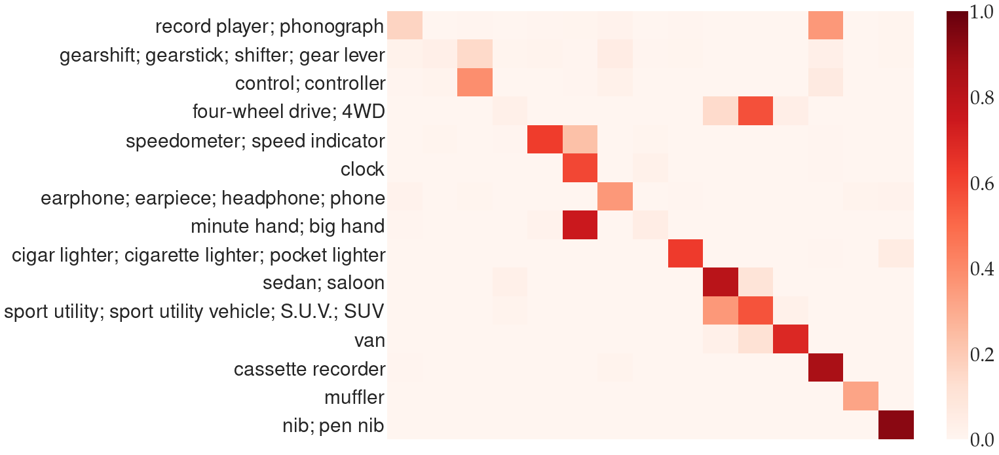

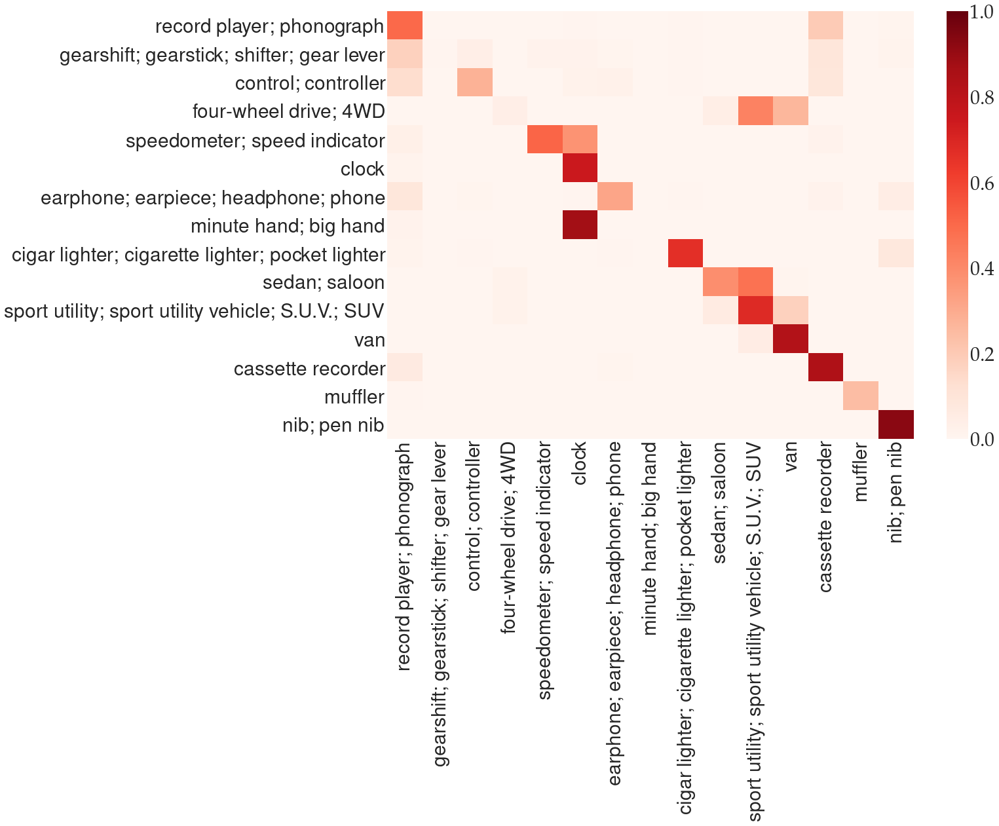

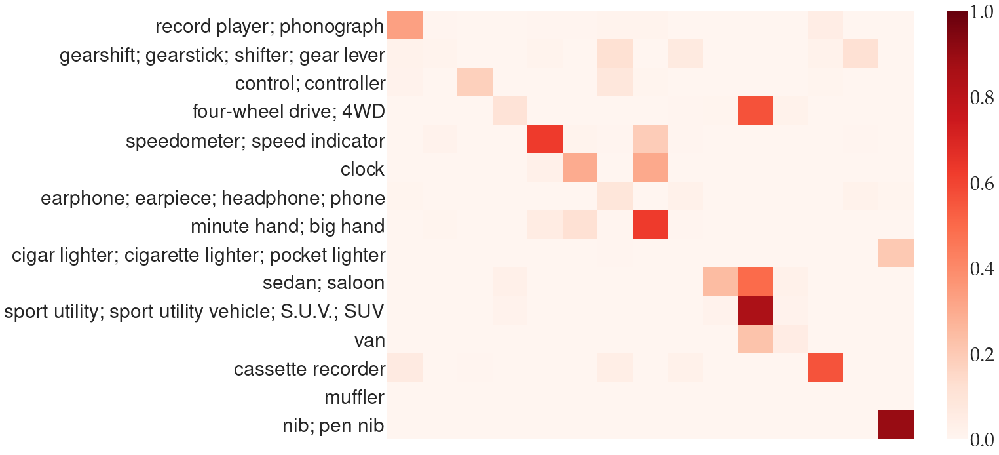

In [35]:
plot_class_cm3_figure(glove_cm, albert_xxl_cm, w2v_classnames_cm, 'n03163222',
              thres_1=0.05, thres_2=0.1,
              save=True)

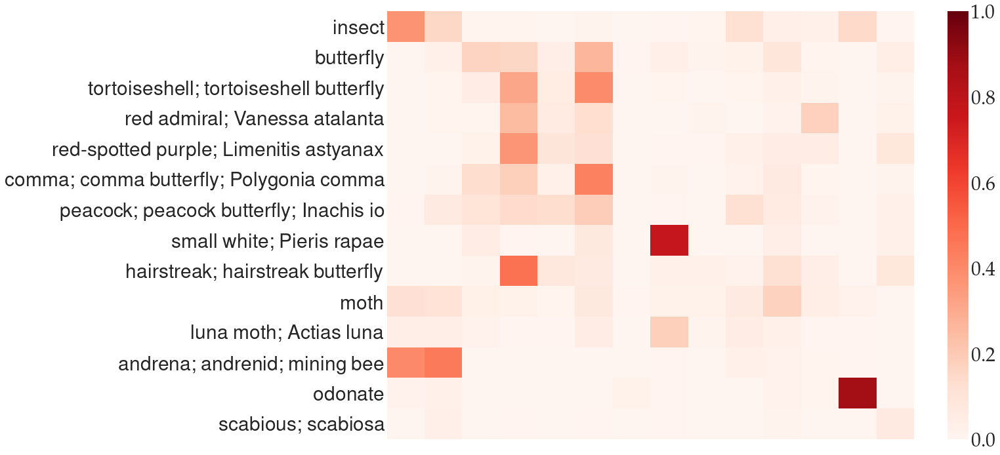

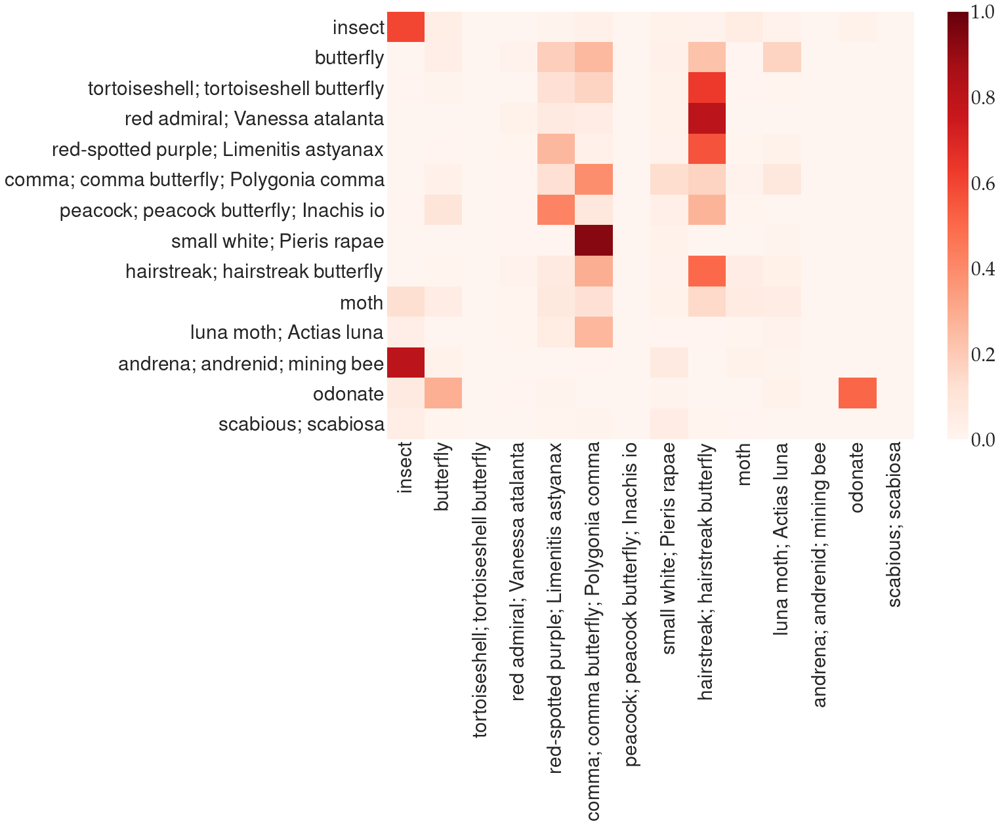

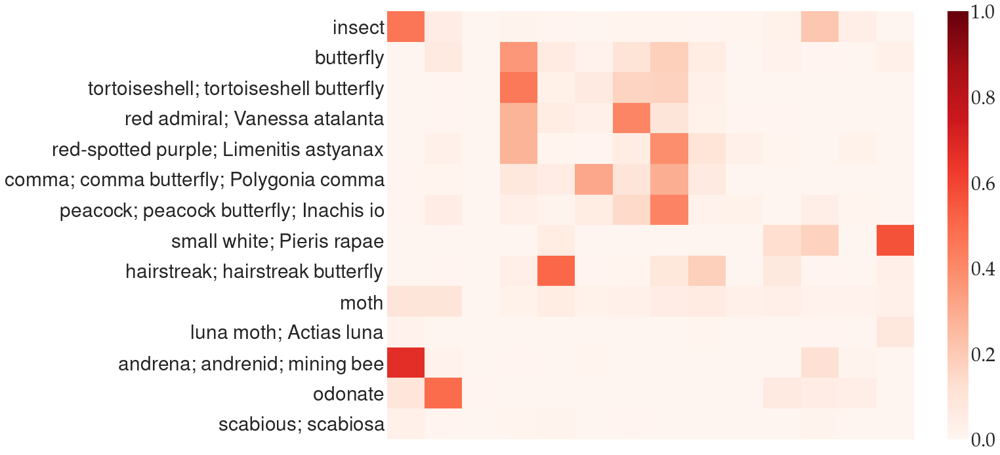

In [36]:
plot_class_cm3_figure(glove_cm, albert_xxl_cm, w2v_classnames_cm, 'n02210427',
              thres_1=0.05, thres_2=0.1,
              save=True)

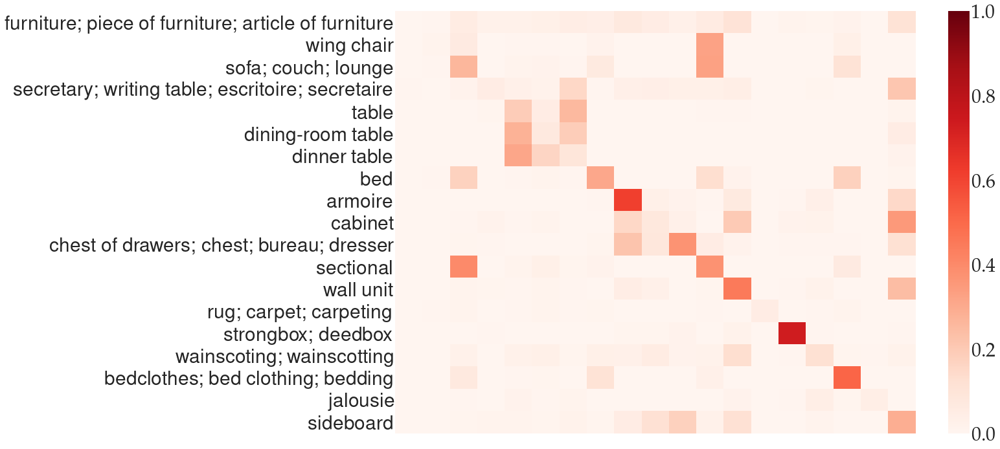

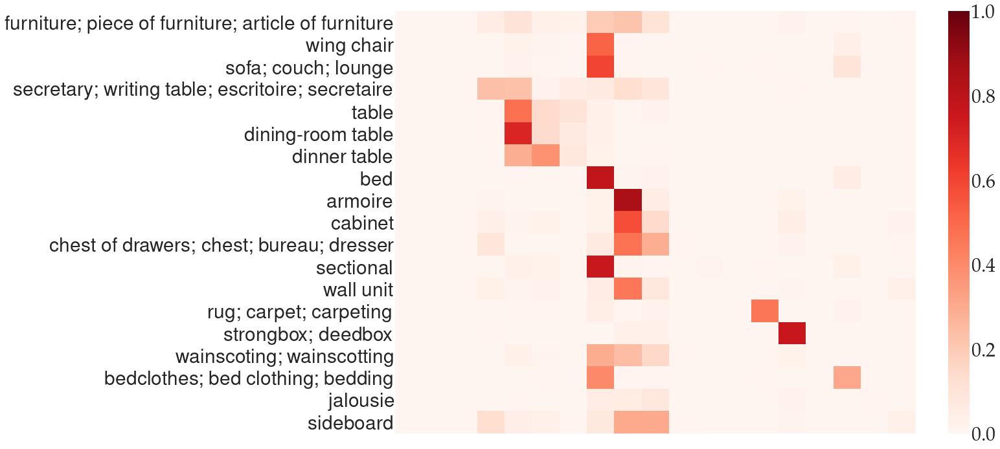

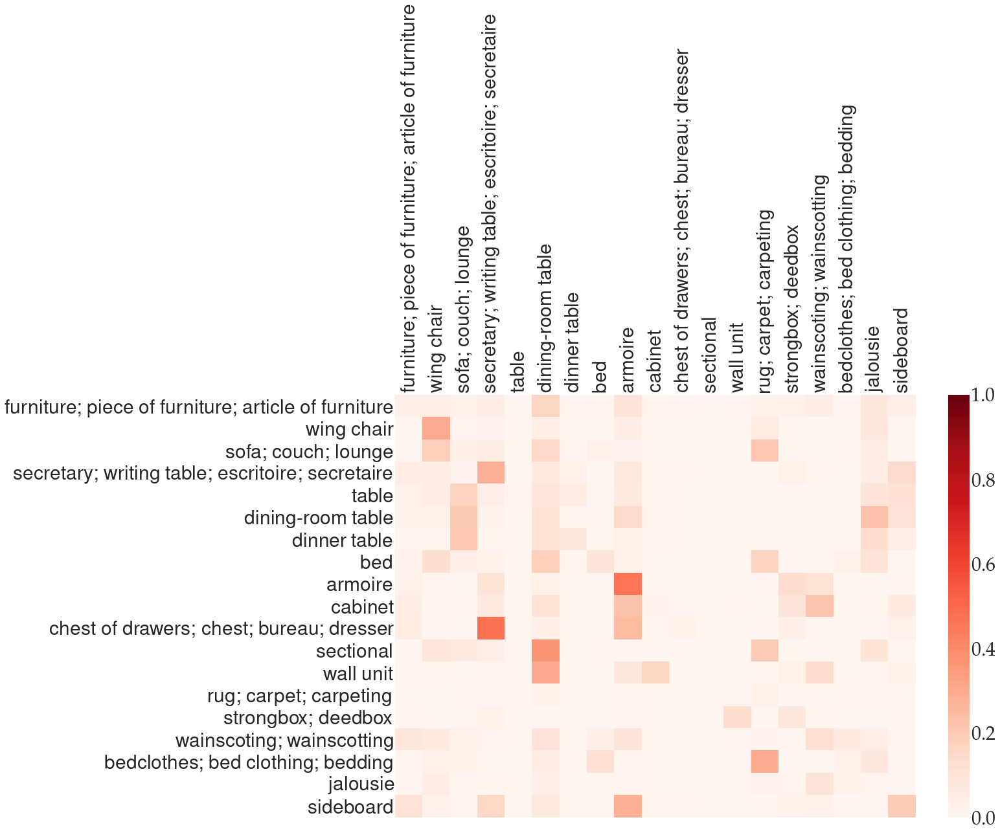

In [32]:
plot_class_cm3_figure(glove_cm, albert_xxl_cm, w2v_classnames_cm, 'n03015254',
              thres_1=0.05, thres_2=0.1,
              save=True)

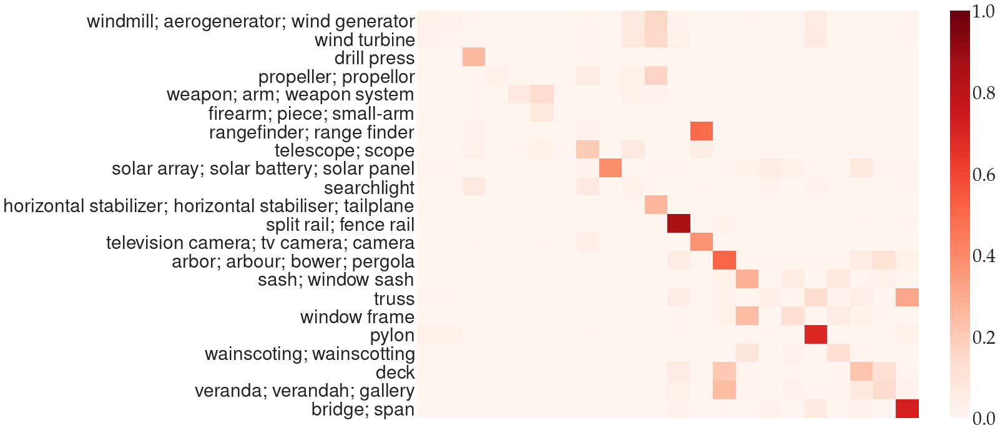

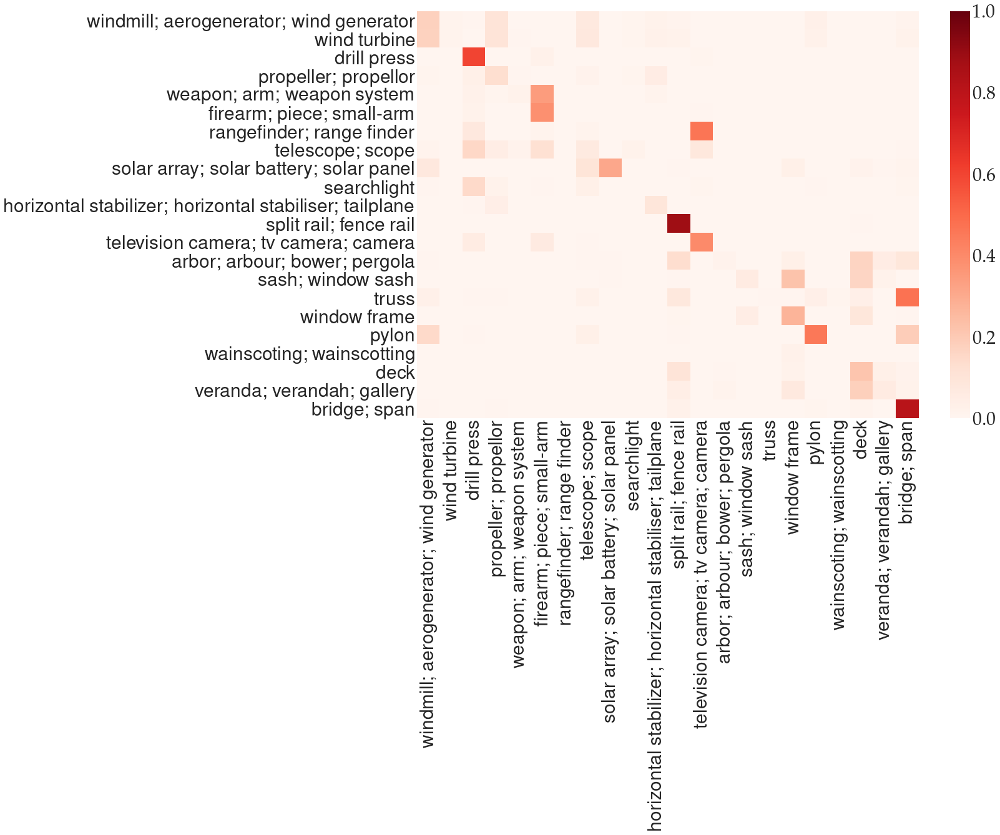

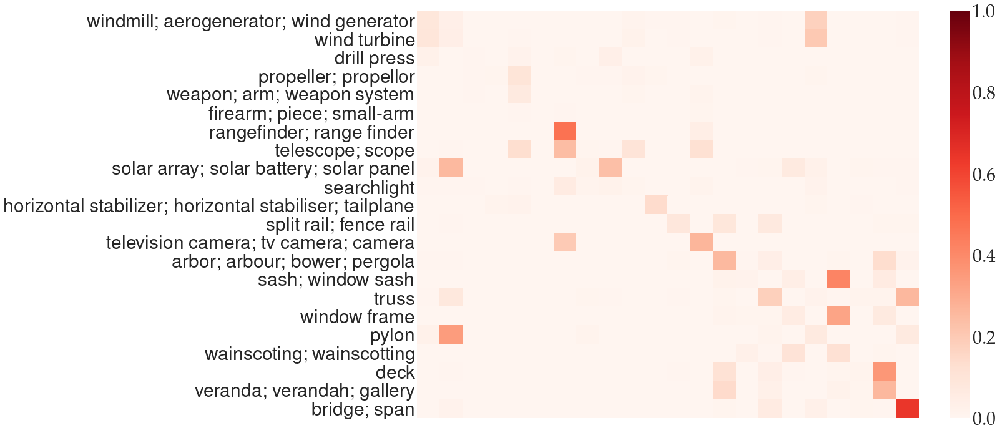

In [38]:
plot_class_cm3_figure(glove_cm, albert_xxl_cm, w2v_classnames_cm, 'n04257790',
              thres_1=0.05, thres_2=0.1,
              save=True)